In [1]:
# Cell 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Cell 2: Kiểm tra GPU (Đảm bảo Runtime type là T4 GPU)
!nvidia-smi

Sun Nov  2 16:06:49 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   65C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
# Cell 3: Cài đặt các tiện ích cần thiết (nếu chưa có)
!sudo apt-get install unzip -y -qq
!sudo apt-get install tree -y -qq

debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tree.
(Reading database ... 125080 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...


In [4]:
# Cell3.5: Unzip the Dataset
import os
zip_path = '/content/drive/MyDrive/Final Deep Learning Prj/Dataset.zip'
# -----------------------

output_path = '/content/'

print(f"Bắt đầu giải nén file từ: {zip_path}...")
!unzip -q "{zip_path}" -d "{output_path}"
print("Giải nén hoàn tất! Thư mục 'Dataset' đã ở trong /content/")

Bắt đầu giải nén file từ: /content/drive/MyDrive/Final Deep Learning Prj/Dataset.zip...
Giải nén hoàn tất! Thư mục 'Dataset' đã ở trong /content/


In [5]:
# Cell 4: Cài đặt Thư viện và Vá lỗi

# 1. Cài đặt các thư viện từ tutorial
print("Installing torchmetrics, pycocotools, and tensorboard...")
!pip install -qq torchmetrics[detection]
!pip install -qq pycocotools
!pip install -qq tensorboard

# 2. VÁ LỖI 'pycocotools' (Sửa lỗi 'AssertionError' và 'int/str')
# Chúng ta sẽ sửa file coco.py ngay sau khi cài đặt
import pycocotools.coco
import importlib
path_to_patch = pycocotools.coco.__file__
print(f"Patching file at: {path_to_patch}")

try:
    with open(path_to_patch, 'r') as f:
        content = f.read()
    original_content = content
    patched = False

    # Patch 1: Sửa lỗi so sánh int/str (Từ file Fin_DL.ipynb)
    old_line_1 = "annsImgIds = [ann['image_id'] for ann in anns]"
    new_line_1 = "annsImgIds = [int(ann['image_id']) for ann in anns]"
    if old_line_1 in content:
        content = content.replace(old_line_1, new_line_1)
        print("Applied Patch 1 (int/str fix).")
        patched = True

    # Patch 2: Sửa lỗi AssertionError (Từ file Fin_DL.ipynb)
    old_line_2 = "assert set(annsImgIds) == (set(annsImgIds) & set(self.getImgIds())), \\"
    new_line_2 = "assert set(annsImgIds) <= (set(annsImgIds) & set(self.getImgIds())), \\"
    if old_line_2 in content:
        content = content.replace(old_line_2, new_line_2)
        print("Applied Patch 2 (AssertionError fix).")
        patched = True

    # Ghi đè file
    if patched:
        with open(path_to_patch, 'w') as f:
            f.write(content)
        print("\nFile 'coco.py' patched successfully.")
    else:
        print("\nFile 'coco.py' seems already patched.")

    # Tải lại (RELOAD) module ngay lập tức
    print("Reloading 'pycocotools.coco' module...")
    importlib.reload(pycocotools.coco)
    print("Module reloaded.")

except Exception as e:
    print(f"--- ERROR DURING PATCHING ---: {e}")


# 3. Tải các script trợ giúp từ repo TorchVision (như trong tutorial)
print("\nCloning torchvision repository for helper scripts...")
!git clone -q https://github.com/pytorch/vision.git

print("--- Cell 4: Setup Complete ---")

Installing torchmetrics, pycocotools, and tensorboard...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 23.0 MB/s eta 0:00:00
Patching file at: /usr/local/lib/python3.12/dist-packages/pycocotools/coco.py
Applied Patch 1 (int/str fix).
Applied Patch 2 (AssertionError fix).

File 'coco.py' patched successfully.
Reloading 'pycocotools.coco' module...
Module reloaded.

Cloning torchvision repository for helper scripts...
--- Cell 4: Setup Complete ---


In [6]:
# Cell 5: Import Libraries (Đã sửa lỗi và bổ sung)

import os
import gc
import math
import random
import numpy as np
import pandas as pd  # <--- BỔ SUNG: Cần cho file .csv
import cv2           # <--- BỔ SUNG: Cần để đọc ảnh
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from google.colab.patches import cv2_imshow # <--- BỔ SUNG: Cần để hiển thị ảnh
from tqdm.auto import tqdm
from dataclasses import dataclass

# Thư viện PyTorch
import torch
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter

# Thư viện Torchvision
import torchvision
import torchvision.transforms as T
from torchvision.transforms import v2 as Tv2
from torchvision import tv_tensors
from torchvision.transforms import functional as F
from torchvision.transforms.functional import to_pil_image
import torchvision.models.detection as detection
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# Thư viện Đánh giá
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# --- SỬA LỖI ĐƯỜNG DẪN ---
# Thêm thư mục 'vision' (đã tải ở Cell 4) vào Python Path
import sys
sys.path.append('/content/vision/references/detection/')

# Import các file helper (đã tải và vá lỗi ở Cell 4)
import engine
import utils
import coco_eval
import coco_utils
import transforms as T_helper # Đổi tên để tránh xung đột với torchvision.transforms

print("--- Cell 5: All libraries imported successfully. ---")

--- Cell 5: All libraries imported successfully. ---


Giờ mình sẽ set_seed()

-> Nó kiểu như khi mình train model (đb là khi Shuffle=True) -> seed như xáo bài. Nếu không set seed thì mỗi lần chạy train, bài lại xáo khác nhau -> mAP cuối cùng sẽ khác nhau vì loss khác nhau trong từng cụm batch của 1 epoch

-> set seed = 42 thì các bộ gen số ngẫu nhiên của random, numpu, torch,... sẽ bị ép bắt đầu bằng 42

In [7]:
# Cell 6 (Fixed): Set seeds for reproducibility

SEED_VALUE = 42 # <-- ĐƯA RA NGOÀI: Định nghĩa nó ở đây

def set_seeds():
    # fix random seeds
    # Hàm này sẽ tự động sử dụng SEED_VALUE ở bên ngoài
    random.seed(SEED_VALUE)
    np.random.seed(SEED_VALUE)
    torch.manual_seed(SEED_VALUE)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(SEED_VALUE)
        torch.cuda.manual_seed_all(SEED_VALUE)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = True

# Chạy hàm
set_seeds()
print(f"Seeds set to {SEED_VALUE}.") # <-- Bây giờ nó sẽ chạy được!

Seeds set to 42.


Load với EDA sơ qua về dataset class

Đã tải thành công: /content/Dataset/processed/train_annotations.csv
Tổng số hàng (annotations + ảnh sạch): 62669

--- Phân bổ Lớp GỐC (Trước khi gộp) ---
class
D00            21130
D10             9482
D20             8580
D40             5287
D44             4092
D50             2899
Repair           848
D43              623
D01              135
D11               38
Block crack        2
D0w0               1
Name: count, dtype: int64


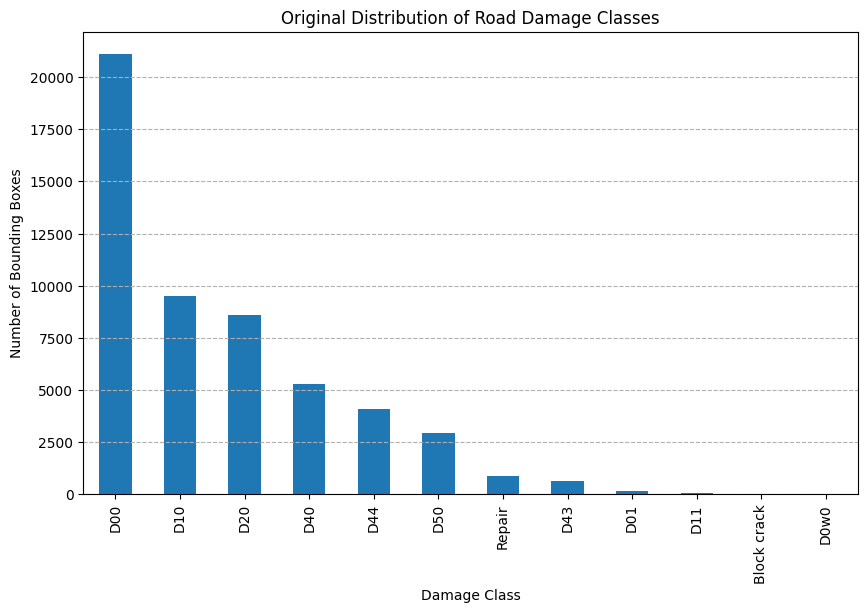

In [8]:
# Cell 7: Tải và Phân tích (EDA) Dữ liệu Training

# 1. Định nghĩa đường dẫn
base_path = '/content/Dataset/processed/'
train_csv_path = os.path.join(base_path, 'train_annotations.csv')
train_img_dir = os.path.join(base_path, 'train/images/')
val_csv_path = os.path.join(base_path, 'val_annotations.csv')
val_img_dir = os.path.join(base_path, 'val/images/')

# 2. Tải train_df
try:
    train_df = pd.read_csv(train_csv_path)
    print(f"Đã tải thành công: {train_csv_path}")
    print(f"Tổng số hàng (annotations + ảnh sạch): {len(train_df)}")
except Exception as e:
    print(f"Lỗi khi tải train_df: {e}")

# 3. Phân tích Phân bổ Lớp GỐC (Original)
valid_df_original = train_df.dropna(subset=['class'])
class_distribution_original = valid_df_original['class'].value_counts()

print("\n--- Phân bổ Lớp GỐC (Trước khi gộp) ---")
print(class_distribution_original)

# 4. Vẽ biểu đồ
plt.figure(figsize=(10, 6))
class_distribution_original.plot(kind='bar')
plt.title('Original Distribution of Road Damage Classes')
plt.xlabel('Damage Class')
plt.ylabel('Number of Bounding Boxes')
plt.grid(axis='y', linestyle='--')
plt.show()

Vì lo lại imbalance -> đến đây t nảy sinh ý tưởng là mình sẽ gộp cái bọn mà class hiếm thành 1 class Other.


*   Nhưng mà model sẽ mất đi sự chi tiết
-> Chấp nhận được tại vì nó làm other còn hơn là model không nhận được các class hiếm



-> Phương án gộp sẽ là gộp bọn Repair + D43 + D01 + D11 + Block crack + D0w0 thành Other

Repair có 848 cũng khá nhiều nhưng mà vấn đề của deep learning không nằm ở con số tuyệt đối mà ở ratio -> cho nên dưới 3k ( trừ D50 là 2k8 tạm được ) thì nên gộp hết lại cho an toàn

Đang gộp các lớp sau thành 'Other': ['Repair', 'D43', 'D01', 'D11', 'Block crack', 'D0w0']

--- Phân bổ Lớp MỚI (Sau khi gộp) ---
class
D00      21130
D10       9482
D20       8580
D40       5287
D44       4092
D50       2899
Other     1647
Name: count, dtype: int64


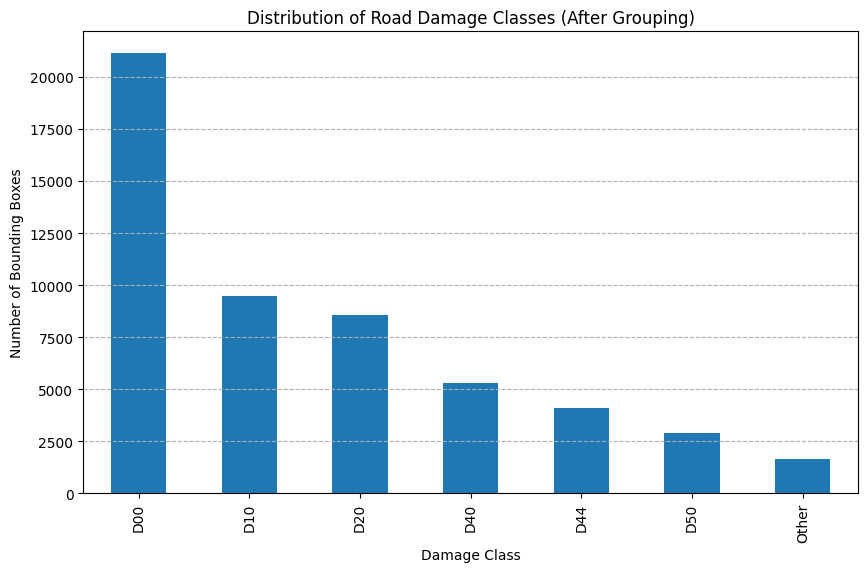

In [9]:
# Cell 8: Gộp các Lớp hiếm

# 1. Tạo bản sao để làm việc
train_df_grouped = train_df.copy()

# 2. Định nghĩa các lớp hiếm (Dựa trên phân tích của chúng ta)
rare_classes = ['Repair', 'D43', 'D01', 'D11', 'Block crack', 'D0w0']
print(f"Đang gộp các lớp sau thành 'Other': {rare_classes}")

# 3. Gộp các lớp hiếm thành 'Other'
train_df_grouped.loc[train_df_grouped['class'].isin(rare_classes), 'class'] = 'Other'

# 4. Tạo bản 'valid' đã gộp để phân tích
valid_df_grouped = train_df_grouped.dropna(subset=['class'])
new_class_distribution = valid_df_grouped['class'].value_counts()

print("\n--- Phân bổ Lớp MỚI (Sau khi gộp) ---")
print(new_class_distribution)

# 5. Vẽ biểu đồ mới
plt.figure(figsize=(10, 6))
new_class_distribution.plot(kind='bar')
plt.title('Distribution of Road Damage Classes (After Grouping)')
plt.xlabel('Damage Class')
plt.ylabel('Number of Bounding Boxes')
plt.grid(axis='y', linestyle='--')
plt.show()

CLASS MAPPING:

Tạo dictionary cho mấy class kia

Note: Faster R-CNN quy ước 0 luôn là lớp "__background__"

In [10]:
# Cell 9: Tạo Ánh xạ Lớp & Bảng màu (Mapping)

# 1. Tạo Ánh xạ Lớp (Class Mappings)
# Dùng 'valid_df_grouped' (đã gộp) từ Cell 8
class_names = valid_df_grouped['class'].unique()
class_names = np.insert(class_names, 0, '__background__') # Thêm background ở vị trí 0
num_classes = len(class_names)

# Tạo từ điển (dictionaries)
class_to_int = {label: i for i, label in enumerate(class_names)}
int_to_class = {i: label for i, label in enumerate(class_names)} # Tương đương với classes_to_idx

print(f"Tổng số lớp (gồm background): {num_classes}")
print("\n--- Ánh xạ Class sang ID (class_to_int) ---")
print(class_to_int)


# 2. Tạo Bảng màu (Tương tự tutorial)
# Ánh xạ TÊN LỚP sang MÀU SẮC
class_color_map = {
    '__background__': 'black',
    'D00': 'red',
    'D10': 'orange',
    'D20': 'yellow',
    'D40': 'blue',
    'D44': 'purple',
    'D50': 'green',
    'Other': 'cyan'
}

# Tạo category_colors (ID sang MÀU SẮC)
category_colors = {class_to_int[name]: color for name, color in class_color_map.items() if name in class_to_int}

print("\n--- Ánh xạ ID sang Màu (category_colors) ---")
print(category_colors)

Tổng số lớp (gồm background): 8

--- Ánh xạ Class sang ID (class_to_int) ---
{'__background__': 0, 'D10': 1, 'D00': 2, 'D20': 3, 'Other': 4, 'D40': 5, 'D44': 6, 'D50': 7}

--- Ánh xạ ID sang Màu (category_colors) ---
{0: 'black', 2: 'red', 1: 'orange', 3: 'yellow', 5: 'blue', 6: 'purple', 7: 'green', 4: 'cyan'}


Rút kinh nghiệm bbox lỗi -> lần này lại tiếp tục clean bbox

In [11]:
# Cell 10: Dọn dẹp Bounding Box lỗi (Training Set)

# 'train_df_grouped' được tạo ở Cell 8
print(f"Số hàng ban đầu (train_df_grouped): {len(train_df_grouped)}")

# 1. Tìm các box có (width <= 0) hoặc (height <= 0)
invalid_boxes = train_df_grouped[
    (train_df_grouped['xmin'] >= train_df_grouped['xmax']) |
    (train_df_grouped['ymin'] >= train_df_grouped['ymax'])
]

print(f"\nTìm thấy {len(invalid_boxes)} box lỗi (width=0 hoặc height=0).")
if len(invalid_boxes) > 0:
    print("Các hàng lỗi được tìm thấy (dựa trên 'image_418684.png'):")
    print(invalid_boxes)

# 2. Xóa các hàng (rows) bị hỏng
# Tạo một DataFrame 'sạch' mới
train_df_cleaned = train_df_grouped.drop(invalid_boxes.index)

print(f"\nSố hàng mới (train_df_cleaned): {len(train_df_cleaned)}")
print("Dọn dẹp tập Training hoàn tất.")

Số hàng ban đầu (train_df_grouped): 62669

Tìm thấy 1 box lỗi (width=0 hoặc height=0).
Các hàng lỗi được tìm thấy (dựa trên 'image_418684.png'):
               image_id          filename country  width  height class   xmin  \
21812  Japan_001265.jpg  Japan_001265.jpg   Japan    640     640   D20  211.2   

        ymin   xmax    ymax                                           abs_path  
21812  505.6  211.2  506.67  D:\Learning\B3\Deep_learning_prj\Dataset\Japan...  

Số hàng mới (train_df_cleaned): 62668
Dọn dẹp tập Training hoàn tất.


Giờ ta sẽ cần 1 hàm giúp vẽ bbox và sẽ dùng ở 2 chỗ:

1. Để visualize train_annotation.cvs có khớp ảnh không

2. Để ở cell cuối vẽ predicted lên ảnh test


In [12]:
# Cell 11 (Fixed): Hàm trợ giúp Vẽ Bounding Box (Đã sửa lỗi NaN)

# 'cv2', 'cv2_imshow', 'np', 'os', 'pd' đã được import ở Cell 4 và 5
# 'category_colors' và 'class_to_int' đã được định nghĩa ở Cell 9

def draw_bounding_boxes_cv2(image_np, annotations, class_to_int_map):
    """
    Vẽ bounding box lên ảnh (dùng OpenCV) với các màu sắc khác nhau.
    """
    draw_image = image_np.copy()

    # Tạo map ngược (int -> class name)
    int_to_class_map = {v: k for k, v in class_to_int_map.items()}

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.6
    thickness = 2

    for index, row in annotations.iterrows():

        # --- !!! SỬA LỖI Ở ĐÂY !!! ---
        # Kiểm tra xem hàng này có phải là 'NaN' (ảnh sạch) không
        if pd.isnull(row['class']):
            continue # Nếu là NaN, bỏ qua hàng này và đi tiếp
        # --- !!! HẾT SỬA LỖI ---

        # Lấy tọa độ
        xmin = int(row['xmin'])
        ymin = int(row['ymin'])
        xmax = int(row['xmax'])
        ymax = int(row['ymax'])

        # Lấy class ID và Tên
        label_name = str(row['class'])
        label_id = class_to_int_map.get(label_name, 0)

        # Lấy màu (B, G, R)
        color_name = category_colors.get(label_id, 'white')
        color_bgr = {
            'red': (0, 0, 255), 'orange': (0, 165, 255), 'yellow': (0, 255, 255),
            'blue': (255, 0, 0), 'purple': (128, 0, 128), 'green': (0, 128, 0),
            'cyan': (255, 255, 0), 'black': (0, 0, 0), 'white': (255, 255, 255)
        }.get(color_name)

        # Vẽ hình chữ nhật
        cv2.rectangle(draw_image, (xmin, ymin), (xmax, ymax), color_bgr, thickness)
        cv2.putText(draw_image, label_name, (xmin, ymin - 10), font, font_scale, color_bgr, thickness)

    return draw_image

print("Cell 11 (Fixed) executed. Hàm 'draw_bounding_boxes_cv2' (đã sửa lỗi NaN) đã được định nghĩa.")

Cell 11 (Fixed) executed. Hàm 'draw_bounding_boxes_cv2' (đã sửa lỗi NaN) đã được định nghĩa.


Sanity Check

--- Đang hiển thị 5 ảnh ngẫu nhiên từ tập Training ---


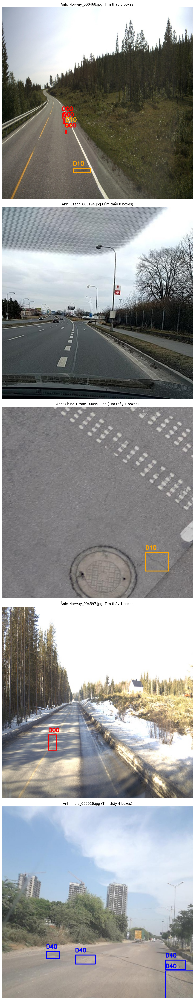

In [13]:
# Cell 12 (Fixed): Trực quan hóa 5 ảnh ngẫu nhiên

# --- SỬA LỖI: Thêm các import của PIL (Pillow) ---
from PIL import Image, ImageDraw, ImageFont
# -----------------------------------------------

# 'train_df_cleaned' (từ Cell 10)
# 'train_img_dir' (từ Cell 7)
# 'draw_bounding_boxes_cv2' (từ Cell 11)  <-- TÊN HÀM ĐÚNG LÀ ĐÂY
# 'class_to_int' (từ Cell 9)
# 'random', 'cv2', 'plt', 'os', 'pd', 'np' (từ các cell trước)

def visualize_samples_rdd(df, img_dir, class_map, num_samples=5):

    # 1. Lấy danh sách tên file DUY NHẤT
    unique_filenames = df['filename'].unique()

    # 2. Chọn ngẫu nhiên 5 tên file
    random_filenames = random.sample(list(unique_filenames), num_samples)

    print(f"--- Đang hiển thị {num_samples} ảnh ngẫu nhiên từ tập Training ---")

    plt.figure(figsize=(15, num_samples * 10))

    # 3. Lặp qua các file đã chọn
    for i, filename in enumerate(random_filenames):
        image_path = os.path.join(img_dir, filename)

        if not os.path.exists(image_path):
            print(f"BỎ QUA: Không tìm thấy file {filename}")
            continue

        # 4. Đọc ảnh bằng CV2
        image_cv = cv2.imread(image_path) # Đọc bằng OpenCV (trả về Numpy array)

        # 5. Lấy TẤT CẢ annotations cho ảnh này
        image_annotations = df[df['filename'] == filename]

        # 6. --- SỬA LỖI: GỌI HÀM ĐÚNG ---
        # Gọi hàm 'draw_bounding_boxes_cv2' (từ Cell 11)
        # Hàm này nhận vào ảnh Numpy (image_cv) và DataFrame (image_annotations)
        image_with_boxes_cv = draw_bounding_boxes_cv2(image_cv, image_annotations, class_map)

        # 7. Chuyển ảnh (đã vẽ) sang RGB để Matplotlib hiển thị đúng màu
        image_rgb = cv2.cvtColor(image_with_boxes_cv, cv2.COLOR_BGR2RGB)

        # 8. Hiển thị
        plt.subplot(num_samples, 1, i + 1)
        plt.imshow(image_rgb) # Hiển thị ảnh đã chuyển sang RGB
        plt.axis('off')
        plt.title(f"Ảnh: {filename} (Tìm thấy {len(image_annotations[pd.notnull(image_annotations['class'])])} boxes)")

    plt.tight_layout()
    plt.show()

# --- Chạy hàm ---
visualize_samples_rdd(train_df_cleaned, train_img_dir, class_to_int)

Dựa theo file annotations thì các ảnh đều ở dạng 640x640 -> hình vuông rồi nên không cần rotate hay gì

T xem các prj khác, với các ảnh to thì người ta thường dùng phương pháp patches -> cách 1 ảnh to thành 4 patches có overlap ( khoảng 20%) -> train bằng số ảnh gốc x 4

Nhưng prj của mình dataset có ảnh khá đẹp, không quá to, ít pixels nên không cần

Data Class Preparation

-> Dùng datasetconfig -> nó giống như 1 cái hộp, 1 cái thẻ tên

-> Ở đây ta sẽ để nó chứa  3 thứ ta cần là annotations, img và transform

In [14]:
# Cell 13 (Fixed v3): SỬA LỖI CHÍ MẠNG (Thêm Tv2.ToImage)

# 'Tv2' và 'torch' đã được import ở Cell 5
# 'Image' (của PIL) đã được import ở Cell 12

class ConvertImageToNumpy(object):
    """Giúp chuyển ảnh PIL (nếu có) sang Numpy trước khi vào Tv2"""
    def __call__(self, image, target):
        if isinstance(image, Image.Image):
            image = np.array(image)
        return image, target

def get_geometry_transform(train):
    """
    Hàm này CHỈ chứa các phép biến đổi HÌNH HỌC (Geometry).
    """
    transforms = []

    # Đảm bảo ảnh luôn là Numpy (H,W,C)
    transforms.append(ConvertImageToNumpy())

    if train:
        print("Đang bật Augmentation (lật ngang) cho tập train...")
        transforms.append(Tv2.RandomHorizontalFlip(p=0.5))

    return Tv2.Compose(transforms)

def get_pixel_transform():
    """
    Hàm này CHỈ chứa các phép biến đổi PIXEL (ToFloat, Normalize).
    """
    transforms = []

    # --- SỬA LỖI LẦN CUỐI LÀ Ở ĐÂY ---
    # 1. Chuyển Numpy (H,W,C) sang tv_tensors.Image (Tensor C,H,W)
    # Đây là bước bị thiếu ở các phiên bản trước!
    transforms.append(Tv2.ToImage())

    # 2. Chuyển sang Float và scale [0, 1]
    transforms.append(Tv2.ToDtype(torch.float32, scale=True))

    # 3. Chuẩn hóa (Normalize)
    transforms.append(Tv2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]))

    return Tv2.Compose(transforms)

print("Cell 13 (Fixed v3) executed.")
print("Đã định nghĩa: 'get_geometry_transform' (cho cả ảnh+target)")
print("Và 'get_pixel_transform' (CHỈ cho ảnh, đã có ToImage())")

Cell 13 (Fixed v3) executed.
Đã định nghĩa: 'get_geometry_transform' (cho cả ảnh+target)
Và 'get_pixel_transform' (CHỈ cho ảnh, đã có ToImage())


In [15]:
# Cell 14: Định nghĩa Dataclass Config (Đã sửa cho RDD2022)

# '@dataclass' đã được import ở Cell 4
@dataclass
class DatasetConfig:
    annotations_file: str # Đường dẫn đầy đủ đến file .csv
    img_dir: str          # Đường dẫn đầy đủ đến thư mục /images
    # Chúng ta không cần train_img_size vì ảnh 640x640 đã chuẩn rồi

print("Cell 14 executed. 'DatasetConfig' class đã được định nghĩa.")

Cell 14 executed. 'DatasetConfig' class đã được định nghĩa.


In [16]:
# Cell 15 (Fixed v7): THÊM DEBUG PRINT STATEMENTS

# 'Dataset' (của PyTorch) và 'pd', 'cv2', 'torch', 'tv_tensors' đã được import

class RoadDamageDataset(Dataset):

 def __init__(self, config: DatasetConfig, class_map: dict, transforms=None):
  super().__init__()

  self.img_dir = config.img_dir
  self.geometry_transforms = transforms
  self.pixel_transform = get_pixel_transform() # Lấy từ Cell 13 (v3)
  self.class_to_int = class_map

  # (Code xử lý DF giữ nguyên)
  df = pd.read_csv(config.annotations_file)
  rare_classes = ['Repair', 'D43', 'D01', 'D11', 'Block crack', 'D0w0']
  df.loc[df['class'].isin(rare_classes), 'class'] = 'Other'
  invalid_boxes = (df['xmin'] >= df['xmax']) | (df['ymin'] >= df['ymax'])
  df = df[~invalid_boxes]

  self.df = df
  self.image_filenames = df['filename'].unique()

 def __len__(self):
  return len(self.image_filenames)

 def __getitem__(self, idx):

  # --- DEBUG: In ra tên ảnh đang xử lý ---
  image_filename = self.image_filenames[idx]
  # print(f"[Debug] Lấy item {idx}: {image_filename}") # (Tùy chọn: bỏ comment nếu muốn)
  # ----------------------------------------

  image_path = os.path.join(self.img_dir, image_filename)

  # 2. Đọc ảnh (Giữ nguyên)
  image = cv2.imread(image_path)
  if image is None:
      image = np.zeros((640, 640, 3), dtype=np.uint8)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # 3. Lấy annotations
  image_annotations = self.df[self.df['filename'] == image_filename]

  # 4. Lấy Boxes (Giữ nguyên)
  boxes = image_annotations[['xmin', 'ymin', 'xmax', 'ymax']].values
  boxes = tv_tensors.BoundingBoxes(boxes, format="XYXY", canvas_size=image.shape[:2])

  # 5. Lấy Labels
  labels_str = image_annotations['class'].values

  # --- DEBUG: In ra số lượng box TÌM THẤY TRƯỚC KHI xử lý ---
  # (NaN cũng được coi là 1 "box" ở bước này)
  # print(f"[Debug]   Tìm thấy {len(labels_str)} hàng annotations.")
  # ---------------------------------------------------------

  if pd.isnull(labels_str).all():
    # Ảnh sạch (Clean)
    labels = torch.empty((0,), dtype=torch.int64)
    boxes = tv_tensors.BoundingBoxes(torch.empty((0, 4)), format="XYXY", canvas_size=image.shape[:2])
  else:
    # Ảnh có hư hỏng
    labels = [self.class_to_int[label] for label in labels_str]
    labels = torch.as_tensor(labels, dtype=torch.int64)

  # 6. Tạo target
  target = {}
  target["boxes"] = boxes
  target["labels"] = labels
  target["image_id"] = torch.tensor([idx])

  # 7. 'area' (Giữ nguyên)
  area = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1]) if boxes.shape[0] > 0 else torch.empty((0,), dtype=torch.float32)
  target["area"] = area

  # 8. 'iscrowd' (Giữ nguyên)
  target["iscrowd"] = torch.zeros((labels.shape[0],), dtype=torch.int64)

  # --- DEBUG: In ra số lượng box SAU KHI xử lý ---
  if idx < 10: # Chỉ in 10 ảnh đầu tiên để tránh spam
      print(f"  [Debug] __getitem__(idx={idx}): Trả về {boxes.shape[0]} box.")
  # -------------------------------------------------

  # 9. Áp dụng Geometry Transforms
  if self.geometry_transforms:
    image, target = self.geometry_transforms(image, target)

  # 10. Áp dụng Pixel Transforms
  image = self.pixel_transform(image)

  return image, target

print("Cell 15 (Fixed v7) executed. 'RoadDamageDataset' (với DEBUG PRINT) đã được định nghĩa.")

Cell 15 (Fixed v7) executed. 'RoadDamageDataset' (với DEBUG PRINT) đã được định nghĩa.


In [17]:
# Cell 16 (Fixed v2): Khởi tạo Datasets (với Geometry Transforms)

print("Đang khởi tạo configs...")
train_config = DatasetConfig(annotations_file=train_csv_path, img_dir=train_img_dir)
val_config = DatasetConfig(annotations_file=val_csv_path, img_dir=val_img_dir)
print("Configs đã tạo.")

print("\nĐang khởi tạo Datasets (với Transforms)...")

# 3. Khởi tạo Training Dataset
train_dataset = RoadDamageDataset(
 train_config,
 class_to_int,
 transforms=get_geometry_transform(train=True) # <-- SỬA Ở ĐÂY (dùng hàm geometry)
)

# 4. Khởi tạo Validation Dataset
val_dataset = RoadDamageDataset(
 val_config,
 class_to_int,
 transforms=get_geometry_transform(train=False) # <-- SỬA Ở ĐÂY (dùng hàm geometry)
)

print("\n--- Khởi tạo Datasets HOÀN TẤT! ---")
print(f"Length of Train Dataset: {len(train_dataset)} ảnh (duy nhất)")
print(f"Length of Validation Dataset: {len(val_dataset)} ảnh (duy nhất)")

Đang khởi tạo configs...
Configs đã tạo.

Đang khởi tạo Datasets (với Transforms)...
Đang bật Augmentation (lật ngang) cho tập train...

--- Khởi tạo Datasets HOÀN TẤT! ---
Length of Train Dataset: 31093 ảnh (duy nhất)
Length of Validation Dataset: 3838 ảnh (duy nhất)


Có dataset rồi -> tiếp theo là wrap nó vào dataloader

def collate function (hàm đối chiếu) -> không cần tự def vì cell 15 của mình trả về tensor rỗng khi gặp ảnh NaN

-> dùng hàm collate_fn của TorchVision

Và cả dataloader:
kiểu mình có dataset rồi, nhưng không thể nạp cùng lúc 31k ảnh vào gpu -> cần dataloader


1.   lấy dataset
2.   shuffle training set ( để mỗi epoch model học một thứ tự khác nhau )
3. gom thành các batches ("lô") nhỏ, kiểu như mỗi lần lấy 4 hoặc 8 ảnh ctct



** Vấn đề của object detection
Kiểu
*   ảnh A có 3 bbox
*   ảnh B có 1 bbox
* ảnh C lại có 7 bbox

-> Pytorch dataloader mặc định không biết cách xếp chồng 3 tensor có size khác nhau thành 1 batch
-> Ta dùng hàm collate_fn để giúp dataloader là: đừng có cố xếp lại -> giữ nguyên dạng là một list các target (kiểu dictionary ấy)



In [18]:
# Cell 17: Khởi tạo DataLoaders (Đã sửa cho RDD2022)
BATCH_SIZE = 8

# utils.collate_fn (từ Cell 5) là của TorchVision, nó xử lý list(ảnh tensor)
# và list(target dict) một cách chính xác
train_loader = DataLoader(
 train_dataset,
 batch_size=BATCH_SIZE,
 shuffle=True,
 collate_fn=utils.collate_fn
)

val_loader = DataLoader(
 val_dataset,
 batch_size=BATCH_SIZE,
 shuffle=False,
 collate_fn=utils.collate_fn
)

print(f"DataLoaders created with BATCH_SIZE = {BATCH_SIZE}")

DataLoaders created with BATCH_SIZE = 8


Đang lặp qua train_loader (Cell 17) để tìm 4 ảnh CÓ BOX (với v4)...
Đang tìm batch có chứa bounding box...
Đã tìm thấy và vẽ đủ 4 ảnh có box!


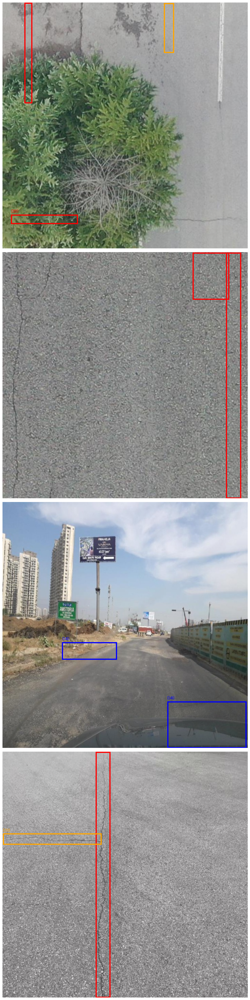

In [19]:
# Cell 18 (Fixed v4): SỬA LỖI LOGIC VẼ (imshow sau khi draw)

# 'plt', 'np', 'Image', 'ImageDraw', 'ImageFont' đã được import

# --- Hàm 1: denormalize_image (Giữ nguyên, đã đúng) ---
def denormalize_image(tensor):
    """Giải chuẩn hóa một ảnh tensor (từ Cell 13) để vẽ."""
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # Chuyển (C, H, W) sang (H, W, C)
    image_np = tensor.cpu().numpy().transpose((1, 2, 0))
    # Giải chuẩn hóa
    image_np = std * image_np + mean
    image_np = np.clip(image_np, 0, 1) # Đảm bảo ảnh trong khoảng [0, 1]
    return image_np

# --- Hàm 2: show_image_with_boxes (SỬA LỖI Ở ĐÂY) ---
def show_image_with_boxes(img_tensor, targets, ax, category_colors, int_to_class_map):
    """Vẽ ảnh (đã de-normalize) và box (với tên lớp)"""

    # 1. Giải chuẩn hóa ảnh
    img_np = denormalize_image(img_tensor)

    # 2. Dùng PIL để vẽ
    img_pil = Image.fromarray((img_np * 255).astype(np.uint8))
    draw = ImageDraw.Draw(img_pil)
    # ax.imshow(img_pil) # <-- LỖI LÀ Ở ĐÂY, XÓA DÒNG NÀY

    # 3. Lấy boxes và labels (Phần này sẽ chỉ chạy nếu 'boxes' không rỗng)
    if 'boxes' in targets and 'labels' in targets:
        boxes = targets['boxes'].cpu().numpy()
        labels = targets['labels'].cpu().numpy()

        for bbox, label_id in zip(boxes, labels):
            x1, y1, x2, y2 = bbox
            color = category_colors.get(label_id, 'gray')
            label_name = int_to_class_map.get(label_id, 'UNK')

            # VẼ LÊN ẢNH
            draw.rectangle([x1, y1, x2, y2], outline=color, width=3)
            try:
                font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf", 15)
            except IOError:
                font = ImageFont.load_default()
            draw.text((x1, y1 - 15), label_name, fill=color, font=font)

    # 4. --- SỬA LỖI: HIỂN THỊ ẢNH SAU KHI ĐÃ VẼ XONG ---
    ax.imshow(img_pil)
    # ----------------------------------------------------

# --- Hàm 3: visualize_samples (Giữ nguyên code v3, có thể bỏ bớt debug) ---
def visualize_samples(data_loader, category_colors, int_to_class_map, num_samples=4):
    num_rows = num_samples
    num_cols = 1
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10 * num_rows))
    if num_samples == 1:
        axs = [axs]

    samples_visualized = 0
    print("Đang tìm batch có chứa bounding box...")

    for images, targets in data_loader:
        for i in range(len(images)):
            # CHỈ VẼ NẾU ẢNH NÀY CÓ BOX
            if targets[i]['boxes'].shape[0] > 0:

                ax = axs[samples_visualized] # Lấy subplot

                # Lấy ảnh tensor thứ i và target thứ i
                show_image_with_boxes(images[i], targets[i], ax, category_colors, int_to_class_map)
                ax.axis('off')
                samples_visualized += 1

                if samples_visualized >= num_samples:
                    break

        if samples_visualized >= num_samples:
            print(f"Đã tìm thấy và vẽ đủ {num_samples} ảnh có box!")
            break

    if samples_visualized < num_samples:
        print(f"CẢNH BÁO: Chỉ tìm thấy {samples_visualized} ảnh có box.")

    plt.tight_layout()
    plt.show()

# --- Chạy hàm ---
print("Đang lặp qua train_loader (Cell 17) để tìm 4 ảnh CÓ BOX (với v4)...")
visualize_samples(train_loader, category_colors, int_to_class, num_samples=4)

Training Configuration

In [20]:
# Cell 19: Training Configuration
# (Chạy 10 epochs để lấy baseline nhanh)

# 1. Số Epochs
num_epochs = 10

# 2. Biến theo dõi điểm mAP tốt nhất
best_map = -float('inf')

# 3. Chọn thiết bị (GPU nếu có)
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

print(f"Sẽ huấn luyện trong {num_epochs} epochs.")
print(f"Thiết bị được chọn: {DEVICE}")

Sẽ huấn luyện trong 10 epochs.
Thiết bị được chọn: cuda


In [21]:
# Cell 20 (Fixed - DÙNG RESNET-50)

# Import các thư viện cần thiết cho model
from torchvision.models import detection
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch.optim as optim

def get_model(num_classes):

    # --- THAY ĐỔI DUY NHẤT LÀ DÒNG NÀY ---
    # model = detection.fasterrcnn_mobilenet_v3_large_fpn(weights="DEFAULT") # (Model cũ)
    model = detection.fasterrcnn_resnet50_fpn(weights="DEFAULT") # (Model MỚI)
    # ------------------------------------

    # 2. Lấy số lượng "đầu vào" (Giữ nguyên)
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # 3. Thay thế cái đầu dự đoán (Giữ nguyên)
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

# --- Mọi thứ khác giữ nguyên ---
num_classes = len(class_to_int) + 1

print(f"Dataset của chúng ta có {len(class_to_int)} lớp hư hỏng.")
print(f"Khởi tạo model (Backbone: ResNet-50) với {num_classes} lớp.")

# Tải model và đưa lên GPU
model = get_model(num_classes)
model.to(DEVICE)

print("\n--- Tải model (ResNet-50) HOÀN TẤT! ---")

Dataset của chúng ta có 8 lớp hư hỏng.
Khởi tạo model (Backbone: ResNet-50) với 9 lớp.
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:02<00:00, 78.7MB/s]



--- Tải model (ResNet-50) HOÀN TẤT! ---


In [22]:
# Cell 21: Define Optimizer, Scheduler, and Scaler

# 1. Optimizer (SGD)
# Lấy tất cả các tham số (parameters) cần huấn luyện
params = [p for p in model.parameters() if p.requires_grad]
# Dùng SGD như tutorial
optimizer = optim.SGD(
    params,
    lr=0.0005, # (hoặc 5e-4)
    momentum=0.9,
    weight_decay=0.0005
)

# 2. Learning Rate Scheduler (StepLR)
# 'num_epochs' được lấy từ Cell 19 (chúng ta đặt là 10)
# 'step_size' sẽ là 10 // 2 = 5.
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=num_epochs // 2,
    gamma=0.1
)

# 3. Gradient Scaler (Dùng cho Mixed Precision)
# Giúp train nhanh hơn trên T4
scaler = torch.cuda.amp.GradScaler()

print(f"Đã tạo Optimizer (SGD, lr=0.0005).")
print(f"Đã tạo LR Scheduler (Sẽ giảm LR 10 lần tại Epoch {num_epochs // 2}).")
print(f"Đã tạo GradScaler (sẵn sàng cho Mixed Precision).")

Đã tạo Optimizer (SGD, lr=0.0005).
Đã tạo LR Scheduler (Sẽ giảm LR 10 lần tại Epoch 5).
Đã tạo GradScaler (sẵn sàng cho Mixed Precision).


/tmp/ipython-input-1403973410.py:25: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


In [23]:
# Cell 22: Initialize TensorBoard & Imports cho Training Loop

from torch.utils.tensorboard import SummaryWriter
from tqdm.auto import tqdm # Import tqdm cho progress bar

# 1. Khởi tạo TensorBoard
# Đổi tên 'log_dir' cho project RDD của chúng ta
log_dir = 'runs/rdd_detection_v1'
writer = SummaryWriter(log_dir=log_dir)

print(f"Đã import 'SummaryWriter' (TensorBoard) và 'tqdm' (progress bar).")
print(f"Dữ liệu TensorBoard sẽ được lưu tại: {log_dir}")
print("Bạn có thể xem TensorBoard (sau khi bắt đầu train) bằng cách chạy cell:")
print("%load_ext tensorboard")
print(f"%tensorboard --logdir {log_dir}")

Đã import 'SummaryWriter' (TensorBoard) và 'tqdm' (progress bar).
Dữ liệu TensorBoard sẽ được lưu tại: runs/rdd_detection_v1
Bạn có thể xem TensorBoard (sau khi bắt đầu train) bằng cách chạy cell:
%load_ext tensorboard
%tensorboard --logdir runs/rdd_detection_v1


In [24]:
# Cell 23 (Fixed v2): Define the Training Function
# (Sửa lỗi Warning & Dùng MetricLogger thay vì tqdm)

import torch.amp # <-- THÊM IMPORT MỚI

def train_one_epoch(model, data_loader, device, optimizer, print_freq, epoch, scaler=None):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter("lr", utils.SmoothedValue(window_size=1, fmt="{value:.6f}"))
    header = f"Training Epoch {epoch}:"

    # --- SỬA LỖI 1: Xóa tqdm, dùng metric_logger.log_every ---
    # (Chúng ta truyền print_freq từ Cell 27 vào đây)
    for i, (images, targets) in enumerate(metric_logger.log_every(data_loader, print_freq, header)):

        # 1. Chuyển dữ liệu lên GPU
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # 2. SỬA LỖI 2: Sửa Warning (dùng torch.amp)
        with torch.amp.autocast(device_type='cuda', dtype=torch.float16, enabled=scaler is not None):
            # 3. Forward pass (tính loss)
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

        loss_value = losses.item()

        # 4. Backward pass (Backpropagation)
        optimizer.zero_grad()
        if scaler is not None:
            scaler.scale(losses).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            losses.backward()
            optimizer.step()

        # (Scheduler (lr_scheduler) vẫn chạy ở Cell 27 (epoch-level))

        # 5. Ghi lại loss vào logger
        metric_logger.update(loss=losses, **loss_dict)
        metric_logger.update(lr=optimizer.param_groups[0]["lr"])

        # 6. XÓA BỎ tqdm: (Đã xóa dòng tq.set_postfix(...))

        # 7. Ghi lại loss (mỗi batch) vào TensorBoard
        # (Giữ nguyên, không ảnh hưởng)
        writer.add_scalar('Loss/train_total_batch', loss_value, epoch * len(data_loader) + i)
        for k, v in loss_dict.items():
            writer.add_scalar(f'Loss/train_{k}_batch', v.item(), epoch * len(data_loader) + i)

    # --- Kết thúc Epoch ---
    # (Hàm log_every sẽ tự in dòng cuối cùng, nhưng chúng ta in avg_loss cho chắc)
    avg_loss = metric_logger.meters['loss'].global_avg
    print(f"Training Epoch {epoch} - Average Loss: {avg_loss:.4f}")

    # Ghi lại loss TRUNG BÌNH (mỗi epoch) vào TensorBoard
    writer.add_scalar('Loss/avg_train_epoch', avg_loss, epoch)

print("Đã định nghĩa hàm 'train_one_epoch' (v2, dùng MetricLogger, fix Warning).")

Đã định nghĩa hàm 'train_one_epoch' (v2, dùng MetricLogger, fix Warning).


In [25]:
# Cell 24: Import thư viện TorchMetrics
# (Đây là thư viện 'trọng tài' mAP)

# Cài đặt (nếu chưa có trong Colab)
!pip install -q torchmetrics

from torchmetrics.detection import MeanAveragePrecision

print("Đã import 'MeanAveragePrecision' từ torchmetrics.")

Đã import 'MeanAveragePrecision' từ torchmetrics.


In [26]:
# Cell 25 (Fixed v2): Define the Evaluation Function
# (Thay tqdm bằng MetricLogger)

def evaluate(model, data_loader, device, epoch, save_dir=None):

    model.eval()

    metric = MeanAveragePrecision(iou_type="bbox")
    metric.to(device)

    # --- SỬA LỖI: Dùng MetricLogger (thay vì tqdm) ---
    metric_logger = utils.MetricLogger(delimiter="  ")
    header = "Validation:"
    # ----------------------------------------------

    samples = [] # Nơi lưu 5 ảnh để visualize

    with torch.no_grad():
        # --- SỬA LỖI: Dùng metric_logger.log_every ---
        # (Chúng ta set print_freq=50 cho validation)
        for i, (images, targets) in enumerate(metric_logger.log_every(data_loader, 50, header)):

            # Đưa dữ liệu lên GPU
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Chạy forward pass (lấy dự đoán)
            outputs = model(images)

            # --- Định dạng cho torchmetrics ---
            preds = [
                {"boxes": out["boxes"], "scores": out["scores"], "labels": out_labels}
                for out, out_labels in zip(outputs, [o["labels"] for o in outputs]) # (Sửa lỗi nhỏ tiềm ẩn)
            ]
            targs = [
                {"boxes": tgt["boxes"], "labels": tgt["labels"]}
                for tgt in targets
            ]
            # ---------------------------------

            # Cập nhật mAP
            metric.update(preds, targs)

            # Lấy 5 mẫu đầu tiên để visualize
            if len(samples) < 5:
                for img, out, tgt in zip(images, outputs, targets):
                    samples.append((img, out, tgt))
                    if len(samples) >= 5:
                        break

            # (Đã xóa progress_bar.update(1))

    # --- Kết thúc Epoch Validation ---

    # Gọi hàm visualize (Cell 26)
    visualize_predictions([s[0] for s in samples], [s[1] for s in samples], [s[2] for s in samples], save_dir, epoch, writer)

    print("\nĐang tính toán mAP...")
    results = metric.compute()
    print("--- Kết quả mAP: ---")
    print(results)
    print("--------------------")

    # Log mAP lên TensorBoard (Giữ nguyên)
    for k, v in results.items():
        if isinstance(v, torch.Tensor):
            if v.numel() == 1:
                writer.add_scalar(f'mAP/{k}', v.item(), epoch)
            else:
                for idx, value in enumerate(v):
                    class_name = int_to_class.get(idx, f"class_{idx}")
                    if k == 'map_per_class':
                         writer.add_scalar(f'mAP_by_Class/{class_name}', value.item(), epoch)
                    else:
                         writer.add_scalar(f'mAP_Array/{k}_{idx}', value.item(), epoch)

    return results

print("Đã định nghĩa hàm 'evaluate' (v2, dùng MetricLogger).")

Đã định nghĩa hàm 'evaluate' (v2, dùng MetricLogger).


In [27]:
# Cell 26 (MỚI): Định nghĩa hàm 'visualize_predictions'
# (Hàm này bị thiếu trong code tutorial của bạn)

# (Chúng ta cần Matplotlib (plt), PIL (ImageDraw) và Numpy (np))
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import io

# --- Hàm 1: denormalize_image (Copy từ Cell 18) ---
def denormalize_image(tensor):
    """Giải chuẩn hóa một ảnh tensor (từ Cell 13) để vẽ."""
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # Chuyển (C, H, W) sang (H, W, C)
    image_np = tensor.cpu().numpy().transpose((1, 2, 0))
    # Giải chuẩn hóa
    image_np = std * image_np + mean
    image_np = np.clip(image_np, 0, 1) # Đảm bảo ảnh trong khoảng [0, 1]
    return image_np

# --- Hàm 2: visualize_predictions (Hàm chính bị thiếu) ---
def visualize_predictions(images, outputs, targets, save_dir, epoch, writer):
    """Vẽ dự đoán (outputs) và đáp án (targets) lên ảnh và lưu vào TensorBoard."""

    # Chỉ vẽ 5 ảnh (như logic của Cell 25)
    fig, axs = plt.subplots(nrows=len(images), ncols=1, figsize=(15, 10 * len(images)))
    if len(images) == 1:
        axs = [axs] # Sửa lỗi nếu chỉ có 1 ảnh

    for i, (img_tensor, output, target) in enumerate(zip(images, outputs, targets)):
        ax = axs[i]

        # 1. Giải chuẩn hóa ảnh
        img_np = denormalize_image(img_tensor)
        img_pil = Image.fromarray((img_np * 255).astype(np.uint8))
        draw = ImageDraw.Draw(img_pil)

        # 2. Tải font
        try:
            font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf", 15)
        except IOError:
            font = ImageFont.load_default()

        # 3. Vẽ Ground Truth (Đáp án - MÀU XANH LÁ)
        for box, label in zip(target['boxes'].cpu(), target['labels'].cpu()):
            x1, y1, x2, y2 = box
            label_name = int_to_class.get(label.item(), 'UNK')
            draw.rectangle([x1, y1, x2, y2], outline='green', width=3)
            draw.text((x1, y1 - 15), f"GT: {label_name}", fill='green', font=font)

        # 4. Vẽ Predictions (Dự đoán - MÀU ĐỎ)
        # Chỉ vẽ những box có score > 0.5 (để đỡ rối)
        pred_scores = output['scores'].cpu()
        keep_indices = pred_scores > 0.5

        for box, label, score in zip(output['boxes'].cpu()[keep_indices], output['labels'].cpu()[keep_indices], pred_scores[keep_indices]):
            x1, y1, x2, y2 = box
            label_name = int_to_class.get(label.item(), 'UNK')
            draw.rectangle([x1, y1, x2, y2], outline='red', width=3)
            draw.text((x1, y2 + 5), f"Pred: {label_name} ({score:.2f})", fill='red', font=font)

        # 5. Hiển thị ảnh
        ax.imshow(img_pil)
        ax.axis('off')
        ax.set_title(f"Validation Sample {i}")

    plt.tight_layout()

    # 6. Gửi ảnh lên TensorBoard
    writer.add_figure('Validation/Predictions', fig, global_step=epoch)

    # (Không cần lưu file, gửi lên TensorBoard là đủ)
    # plt.savefig(f"{save_dir}/epoch_{epoch}_predictions.png")
    plt.close(fig) # Đóng figure để tiết kiệm bộ nhớ

print("Đã định nghĩa hàm 'visualize_predictions' (Cell 26).")
print("Sửa lỗi cho Cell 25 (evaluate): Giờ nó đã có thể gọi hàm này!")

Đã định nghĩa hàm 'visualize_predictions' (Cell 26).
Sửa lỗi cho Cell 25 (evaluate): Giờ nó đã có thể gọi hàm này!


In [ ]:
# Cell 30: TẢI (LOAD) CHECKPOINT VÀ CHẠY TIẾP (RESUME)

import gc
import time

# --- 1. Sửa đường dẫn (PATH) tới file checkpoint TỐT NHẤT của bạn ---
# (Bạn phải tự tìm trong thư mục Drive, ví dụ nó là Epoch 4)
checkpoint_path = "/content/drive/MyDrive/checkpoints/best_model_checkpoint_epoch_4.pth"

print(f"Đang tải checkpoint từ: {checkpoint_path}")

# --- 2. Tải checkpoint và "NẠP" vào các object đã tạo ---
# (Chúng ta cần 'model', 'optimizer', 'scaler' đã được tạo ở Cell 20, 21)
checkpoint = torch.load(checkpoint_path)

model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# Kiểm tra xem 'scaler' có trong checkpoint không (để tương thích ngược)
if 'scaler' in checkpoint and checkpoint['scaler'] is not None:
    scaler.load_state_dict(checkpoint['scaler'])
else:
    print("Warning: 'scaler' không tìm thấy trong checkpoint, sẽ khởi tạo mới.")

# --- 3. Cập nhật các biến quan trọng ---
# (Chúng ta sẽ bắt đầu từ Epoch tiếp theo)
epoch_start = checkpoint['epoch'] + 1
# (Chúng ta lấy lại điểm mAP tốt nhất đã lưu)
best_map = checkpoint['best_map']

# (Lấy num_epochs từ Cell 19)
print(f"Checkpoint đã tải. mAP tốt nhất là {best_map:.4f}.")
print(f"Sẽ chạy tiếp từ Epoch {epoch_start} đến {num_epochs-1}.")

# --- 4. Vòng lặp Training (Copy từ Cell 27, nhưng sửa 1 dòng) ---

save_dir = "/content/drive/MyDrive/checkpoints" # (Giữ nguyên)
start_time = time.time()

try:
    # --- THAY ĐỔI DUY NHẤT LÀ DÒNG NÀY ---
    for epoch in range(epoch_start, num_epochs):

        torch.cuda.empty_cache()
        gc.collect()

        # 1. Huấn luyện (Hàm từ Cell 23)
        train_one_epoch(
            model,
            train_loader,
            DEVICE,
            optimizer,
            print_freq=50,
            epoch=epoch,
            scaler=scaler
        )

        # 2. Cập nhật Learning Rate
        lr_scheduler.step()

        # 3. Kiểm thử (Hàm từ Cell 25)
        results = evaluate(
            model,
            val_loader,
            DEVICE,
            epoch,
            save_dir=save_dir
        )

        # 4. Lưu lại model TỐT NHẤT
        current_map = results['map'].item()

        if current_map > best_map:
            best_map = current_map
            print(f"\n--- mAP CẢI THIỆN! ({best_map:.4f}) ---")
            print(f"Đang lưu model checkpoint tại Epoch {epoch}...")

            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_map': best_map,
                'scaler': scaler.state_dict() if scaler is not None else None
            }, f'{save_dir}/best_model_checkpoint_epoch_{epoch}.pth')

        print(f"\n--- KẾT THÚC EPOCH {epoch} ---")
        print(f"mAP hiện tại: {current_map:.4f} | mAP tốt nhất: {best_map:.4f}\n")

except KeyboardInterrupt:
    print("\nTraining bị ngắt quãng bởi người dùng.")
finally:
    total_time = time.time() - start_time
    print(f"--- HUẤN LUYỆN HOÀN TẤT! ---")
    print(f"Tổng thời gian (phiên này): {total_time / 60:.2f} phút")
    print(f"Model tốt nhất (mAP = {best_map:.4f}) đã được lưu tại: {save_dir}")
    writer.close()

Đang tải checkpoint từ: /content/drive/MyDrive/checkpoints/best_model_checkpoint_epoch_4.pth
Checkpoint đã tải. mAP tốt nhất là 0.1655.
Sẽ chạy tiếp từ Epoch 5 đến 9.
Training Epoch 5:  [   0/3887]  eta: 1:25:30  lr: 0.000050  loss: 0.1933 (0.1933)  loss_classifier: 0.0627 (0.0627)  loss_box_reg: 0.0355 (0.0355)  loss_objectness: 0.0681 (0.0681)  loss_rpn_box_reg: 0.0270 (0.0270)  time: 1.3198  data: 0.3721  max mem: 13664
Training Epoch 5:  [  50/3887]  eta: 1:01:58  lr: 0.000050  loss: 0.2737 (0.2673)  loss_classifier: 0.0942 (0.0936)  loss_box_reg: 0.0753 (0.0732)  loss_objectness: 0.0521 (0.0682)  loss_rpn_box_reg: 0.0185 (0.0323)  time: 0.9187  data: 0.1207  max mem: 13664
Training Epoch 5:  [ 100/3887]  eta: 0:59:56  lr: 0.000050  loss: 0.2209 (0.2477)  loss_classifier: 0.0858 (0.0901)  loss_box_reg: 0.0611 (0.0704)  loss_objectness: 0.0442 (0.0590)  loss_rpn_box_reg: 0.0188 (0.0282)  time: 0.9273  data: 0.1313  max mem: 13664
Training Epoch 5:  [ 150/3887]  eta: 0:58:47  lr: 0.0

In [ ]:
# Cell 27: The Main Training Loop (ĐÃ SỬA LỖI)

import gc # LỖI 3: Import thư viện Garbage Collector
import time

# Tạo thư mục lưu model (Lưu vào Drive cho an toàn)
save_dir = "/content/drive/MyDrive/RDD_Project/checkpoints"
os.makedirs(save_dir, exist_ok=True)
print(f"Model checkpoints sẽ được lưu tại: {save_dir}")

# Lấy các biến từ các cell trước
# num_epochs (Cell 19)
# model (Cell 20)
# DEVICE (Cell 19)
# optimizer (Cell 21)
# scaler (Cell 21)
# lr_scheduler (Cell 21)
# train_loader (Cell 17)
# val_loader (Cell 17)
# best_map (Cell 19)
# writer (Cell 22)

start_time = time.time()
print(f"--- BẮT ĐẦU HUẤN LUYỆN (Training {num_epochs} epochs) ---")

try:
    for epoch in range(num_epochs):

        # Dọn dẹp bộ nhớ (tốt)
        torch.cuda.empty_cache()
        gc.collect()

        # 1. Huấn luyện (Hàm từ Cell 23)
        train_one_epoch(
            model,
            train_loader, # LỖI 1: Sửa tên (train_data_loader -> train_loader)
            DEVICE,
            optimizer,
            print_freq=50,
            epoch=epoch,
            scaler=scaler
        )

        # 2. Cập nhật Learning Rate (Epoch-level)
        lr_scheduler.step() # LỖI 2: BẬT (uncomment) dòng này

        # 3. Kiểm thử (Hàm từ Cell 25, giờ đã có Cell 26 hỗ trợ)
        results = evaluate(
            model,
            val_loader, # LỖI 1: Sửa tên (val_data_loader -> val_loader)
            DEVICE,
            epoch,
            save_dir=save_dir # (Truyền save_dir vào)
        )

        # 4. Lưu lại model TỐT NHẤT
        current_map = results['map'].item() # Lấy điểm mAP

        if current_map > best_map:
            best_map = current_map
            print(f"\n--- mAP CẢI THIỆN! ({best_map:.4f}) ---")
            print(f"Đang lưu model checkpoint tại Epoch {epoch}...")

            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_map': best_map,
                'scaler': scaler.state_dict() if scaler is not None else None
            }, f'{save_dir}/best_model_checkpoint_epoch_{epoch}.pth') # Lưu vào thư mục Drive

        print(f"\n--- KẾT THÚC EPOCH {epoch} ---")
        print(f"mAP hiện tại: {current_map:.4f} | mAP tốt nhất: {best_map:.4f}\n")

except KeyboardInterrupt:
    print("\nTraining bị ngắt quãng bởi người dùng.")
finally:
    # 5. Dọn dẹp
    total_time = time.time() - start_time
    print(f"--- HUẤN LUYỆN HOÀN TẤT! ---")
    print(f"Tổng thời gian: {total_time / 60:.2f} phút")
    print(f"Model tốt nhất (mAP = {best_map:.4f}) đã được lưu tại: {save_dir}")
    writer.close() # Đóng TensorBoard

Note:
* Eta: tổng thời gian dự kiến chạy xong cho một epoch
* time: thời gian tính theo giây để xử lý 1 batch (0.9079 là 0.9s 1 batch)
* data: thời gian tính theo giây để CPU tải dữ liệu ( đọc 8 ảnh từ ổ đĩa ) trong 0.9s tổng kia
* max mem: lượng VRAM tối đa đang được dùng ( tính theo MB)
* lr: learning rate, mình set là 0.001 -> nhưng ở mất batch đầu là 0 bởi vì kỹ thuật warm-up -> lr sẽ tự tăng dần từ 0 lên 0.001 để model làm quen từ từ và ổn định hơn
* loss: ví dụ như 0.1541 -> đây là total loss = tổng của 4 loại loss con ở sau -> nó càng nhỏ càng tốt
* loss_objectness: thiệt hại về "tính vật thể" -> nó đo xem RPN đoán đúng "chỗ này có object" và "chỗ kia không có object" hay không
* loss_rpn_box_reg: thiệt hại về "hộp đề xuất" -> nó đo xem các hộp đề xuất ban đầu của RPN có bao quanh vật thể tốt không
* loss_classifier: thiệt hại về "phân loại"-> loss chính của head, nó đo xem model đoán đúng class hay không
* loss_box_reg: thiệt hại về "hộp chính xác" -> nó đo xem bbox cuối cùng model đoán ra có khít với actual box không

In [ ]:
# Cell 29: Sửa lỗi (Fix) TensorBoard HTTP 400

print("Kiểm tra thư mục log:")
!ls -l runs/

print("\nĐang 'kill' tất cả các tiến trình tensorboard cũ (nếu có)...")
# Dòng này sẽ tìm và kill các process tensorboard đang chạy
!kill $(ps aux | grep '[t]ensorboard' | awk '{print $2}') > /dev/null 2>&1

print("Đã dọn dẹp. Đang khởi động lại TensorBoard...")
import time
time.sleep(2) # Chờ 2 giây cho chắc

# Tải lại magic command
%load_ext tensorboard
# Chạy lại
%tensorboard --logdir runs/rdd_detection_v1

In [ ]:
# Cell 28: Mở TensorBoard
# (Chạy cell này SAU KHI Cell 27 đã bắt đầu huấn luyện)

%load_ext tensorboard
%tensorboard --logdir runs/rdd_detection_v1